# Notebook 4. FCCU Integrated Results and Manuscript-Ready Comparative Analysis

This notebook consolidates the trained-model results from:
- `FCCU_02_ML_Journal_Workflow.ipynb`
- `FCCU_03_DL_SOTA_Proposed_Journal_Workflow.ipynb`

Design principles:
- only factual results already stored in the executed source notebooks are extracted,
- overlapping models are deduplicated before comparative analysis,
- tables and figures are oriented to manuscript use rather than notebook-internal repetition,
- numeric plot annotations use the Unicode minus sign `−` where required.


In [1]:
import gc
import io
import platform
import warnings
from pathlib import Path
from textwrap import fill

import nbformat as nbf
import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
from IPython.display import Markdown, display

ROOT = Path('.')
SOURCE_NOTEBOOKS = {
    'FCCU_02': ROOT / 'FCCU_02_ML_Journal_Workflow.ipynb',
    'FCCU_03': ROOT / 'FCCU_03_DL_SOTA_Proposed_Journal_Workflow.ipynb',
}
PRIMARY_TARGETS = [
    'gasoline_proxy_wt_pct_of_feed',
    'light_cycle_oil_wt_pct_of_feed',
    'lpg_wt_pct_of_feed',
    'slurry_wt_pct_of_feed',
]
TARGET_LABELS = {
    'gasoline_proxy_wt_pct_of_feed': 'Gasoline proxy',
    'light_cycle_oil_wt_pct_of_feed': 'Light cycle oil',
    'lpg_wt_pct_of_feed': 'LPG',
    'slurry_wt_pct_of_feed': 'Slurry',
}
FAMILY_LABELS = {
    'naive': 'Naive',
    'linear': 'Linear',
    'linear_regularized': 'Regularized linear',
    'feedforward_ann': 'Feedforward ANN',
    'tree_ensemble': 'Tree ensemble',
    'arx_like': 'ARX-like reference',
    'recurrent': 'Recurrent DL',
    'recurrent_attention': 'Attention-augmented recurrent DL',
    'modern_sequence': 'Modern sequence DL',
    'proposed_hybrid': 'Proposed hybrid',
}
INPUT_LABELS = {
    'target_history_only': 'Target history only',
    'exogenous_only': 'Exogenous only',
    'autoregressive_plus_exogenous': 'Autoregressive + exogenous',
}
FAMILY_COLORS = {
    'naive': '#6b7280',
    'linear': '#4c78a8',
    'linear_regularized': '#1f77b4',
    'feedforward_ann': '#9467bd',
    'tree_ensemble': '#2ca02c',
    'arx_like': '#17becf',
    'recurrent': '#ff7f0e',
    'recurrent_attention': '#bc5090',
    'modern_sequence': '#d62728',
    'proposed_hybrid': '#111827',
}
UNICODE_MINUS = '−'
FIG_DPI = 350
JOURNAL_FONT_FAMILY = 'Times New Roman'

warnings.filterwarnings('ignore', category=FutureWarning)
warnings.filterwarnings('ignore', category=UserWarning)
warnings.filterwarnings('ignore', message='findfont')
warnings.filterwarnings('ignore', message='Passing literal html to')

mpl.rcParams.update({
    'figure.dpi': FIG_DPI,
    'savefig.dpi': FIG_DPI,
    'font.family': JOURNAL_FONT_FAMILY,
    'font.serif': [JOURNAL_FONT_FAMILY, 'Times', 'DejaVu Serif'],
    'font.size': 16,
    'axes.titlesize': 17,
    'axes.labelsize': 16,
    'xtick.labelsize': 14,
    'ytick.labelsize': 14,
    'legend.fontsize': 13,
    'legend.title_fontsize': 13,
    'axes.grid': True,
    'axes.unicode_minus': True,
    'grid.alpha': 0.25,
    'axes.spines.top': False,
    'axes.spines.right': False,
})
pd.set_option('display.max_columns', 30)


def uformat(value, fmt='{:.4f}'):
    if pd.isna(value):
        return 'nan'
    return fmt.format(value).replace('-', UNICODE_MINUS)


def pretty_family(value):
    return FAMILY_LABELS.get(value, str(value).replace('_', ' ').title())


def pretty_input(value):
    return INPUT_LABELS.get(value, str(value).replace('_', ' ').title())


def flatten_columns(df):
    frame = df.copy()
    if isinstance(frame.columns, pd.MultiIndex):
        flattened = []
        for col in frame.columns:
            parts = []
            for part in col:
                text = str(part).strip()
                if not text or text.startswith('Unnamed'):
                    continue
                parts.append(text)
            flattened.append(' '.join(parts) if parts else 'column')
        frame.columns = flattened
    else:
        frame.columns = [str(col).strip() for col in frame.columns]
    return frame


def normalize_table(df):
    frame = flatten_columns(df)
    drop_cols = [col for col in frame.columns if str(col).startswith('Unnamed: 0')]
    if drop_cols:
        frame = frame.drop(columns=drop_cols)
    rename_map = {
        'target model': 'model',
        'model model': 'model',
        'target feature_group': 'feature_group',
    }
    frame = frame.rename(columns={col: rename_map[col] for col in frame.columns if col in rename_map})
    return frame


def read_output_tables(path, cell_idx):
    nb = nbf.read(path, as_version=4)
    cell = nb.cells[cell_idx]
    tables = []
    for output_idx, out in enumerate(cell.get('outputs', [])):
        data = out.get('data', {}) if isinstance(out, dict) else {}
        html = data.get('text/html')
        if not html:
            continue
        html = ''.join(html) if isinstance(html, list) else html
        try:
            parsed = pd.read_html(io.StringIO(html))
        except ValueError:
            continue
        for table_idx, df in enumerate(parsed):
            tables.append({
                'output_idx': output_idx,
                'table_idx': table_idx,
                'df': normalize_table(df),
            })
    return tables


def extract_table(tables, required_cols, description, pick='largest'):
    matches = []
    required = set(required_cols)
    for item in tables:
        df = item['df']
        if required.issubset(df.columns):
            matches.append(item)
    if not matches:
        raise KeyError(f'Unable to locate table for {description} with columns {sorted(required)}')
    if pick == 'largest':
        return max(matches, key=lambda item: item['df'].shape[0])['df'].copy()
    return matches[0]['df'].copy()


def coerce_numeric(df, numeric_cols):
    frame = df.copy()
    for col in numeric_cols:
        if col in frame.columns:
            frame[col] = pd.to_numeric(frame[col].astype(str).str.replace('*', '', regex=False), errors='coerce')
    return frame


def show_table(df, formats=None):
    frame = df.copy()
    formats = formats or {}
    for col, fmt in formats.items():
        if col in frame.columns:
            frame[col] = frame[col].map(lambda value, fmt=fmt: uformat(value, fmt) if pd.notna(value) else 'nan')
    try:
        display(frame.style.hide(axis='index'))
    except Exception:
        display(frame)


def create_figure(nrows=1, ncols=1, figsize=(10, 6), sharex=False, sharey=False, squeeze=True):
    fig, axes = plt.subplots(
        nrows=nrows,
        ncols=ncols,
        figsize=figsize,
        sharex=sharex,
        sharey=sharey,
        squeeze=squeeze,
        constrained_layout=False,
        dpi=FIG_DPI,
    )
    fig.patch.set_facecolor('white')
    return fig, axes


def finalize_figure(fig, top=0.90, bottom=0.16, left=0.12, right=0.97, hspace=0.34, wspace=0.26):
    fig.subplots_adjust(top=top, bottom=bottom, left=left, right=right, hspace=hspace, wspace=wspace)


def style_axis(ax, title, xlabel=None, ylabel=None, title_width=58, grid_axis='y'):
    ax.set_title(fill(title, width=title_width), pad=14)
    if xlabel is not None:
        ax.set_xlabel(fill(xlabel, width=40), labelpad=12)
    if ylabel is not None:
        ax.set_ylabel(fill(ylabel, width=30), labelpad=12)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    if grid_axis == 'both':
        ax.grid(True, axis='both', linewidth=0.8, alpha=0.24)
    elif grid_axis in {'x', 'y'}:
        ax.grid(True, axis=grid_axis, linewidth=0.8, alpha=0.24)
    else:
        ax.grid(False)
    ax.tick_params(axis='x', pad=7)
    ax.tick_params(axis='y', pad=7)


def add_bar_labels(ax, bars, fmt='{:.4f}', pad_frac=0.012):
    values = np.asarray([bar.get_width() for bar in bars], dtype=float)
    finite = values[np.isfinite(values)]
    if finite.size == 0:
        return
    span = float(finite.max() - finite.min())
    if span <= 0:
        span = float(abs(finite.max()) if finite.max() != 0 else 1.0)
    pad = span * pad_frac
    for bar, value in zip(bars, values):
        ax.text(
            value + pad,
            bar.get_y() + bar.get_height() / 2,
            uformat(value, fmt),
            ha='left',
            va='center',
            fontsize=12.5,
        )


runtime_df = pd.DataFrame([{
    'python': platform.python_version(),
    'platform': platform.platform(),
    'pandas': pd.__version__,
    'matplotlib': mpl.__version__,
    'nbformat': nbf.__version__,
    'source_ml_notebook': SOURCE_NOTEBOOKS['FCCU_02'].name,
    'source_dl_notebook': SOURCE_NOTEBOOKS['FCCU_03'].name,
}])
display(runtime_df)


,python,platform,pandas,matplotlib,nbformat,source_ml_notebook,source_dl_notebook
0,3.11.14,macOS-26.4-arm64-arm-64bit,2.3.3,3.10.8,5.10.4,FCCU_02_ML_Journal_Workflow.ipynb,FCCU_03_DL_SOTA_Proposed_Journal_Workflow.ipynb


## A. Extraction Provenance and Deduplication Policy

The tables below are reconstructed from the stored outputs of the executed source notebooks rather than retyped manually.
This keeps the integrated notebook aligned with the factual results already computed by the trained models.

Deduplication rule:
- if a model appears in both source notebooks, the retained row comes from `FCCU_03`, because that notebook already performs the final integrated deep-learning comparison against the relevant classical references.


In [2]:
ml_tables = read_output_tables(SOURCE_NOTEBOOKS['FCCU_02'], 13)
dl_eval_tables = read_output_tables(SOURCE_NOTEBOOKS['FCCU_03'], 15)
dl_ablation_tables = read_output_tables(SOURCE_NOTEBOOKS['FCCU_03'], 17)
dl_interpret_tables = read_output_tables(SOURCE_NOTEBOOKS['FCCU_03'], 19)

comparison_cols = ['model', 'family', 'input_set', 'validation_rmse', 'validation_mae', 'validation_r2', 'test_rmse', 'test_mae', 'test_r2', 'test_smape', 'parameter_count', 'training_time_sec', 'inference_time_ms']
macro_cols = ['model', 'split', 'target', 'rmse', 'mae', 'r2', 'mape', 'smape']
target_cols = ['model'] + PRIMARY_TARGETS
subgroup_cols = ['model', 'group', 'group_value', 'macro_rmse', 'macro_mae', 'macro_r2', 'n_windows']
scenario_cols = ['model', 'scenario_mean_rmse', 'scenario_std_rmse', 'scenario_median_rmse']
ablation_cols = ['model', 'rmse', 'mae', 'r2', 'smape', 'parameter_count', 'best_epoch', 'training_time_sec']
sensitivity_cols = ['model', 'sensitivity_type', 'setting', 'rmse', 'mae', 'r2', 'training_time_sec']
robustness_cols = ['robustness_type', 'setting', 'rmse', 'mae', 'r2']
importance_cols = ['feature_group', 'importance_mean_drop_in_r2', 'importance_std']

comparison_numeric_cols = ['validation_rmse', 'validation_mae', 'validation_r2', 'test_rmse', 'test_mae', 'test_r2', 'test_smape', 'parameter_count', 'training_time_sec', 'inference_time_ms', 'best_validation_epoch']

ml_comparison_df = coerce_numeric(extract_table(ml_tables, comparison_cols, 'ML comparison table'), comparison_numeric_cols)
ml_macro_df = coerce_numeric(extract_table(ml_tables, macro_cols, 'ML macro table'), ['rmse', 'mae', 'r2', 'mape', 'smape'])
ml_target_rmse_df = coerce_numeric(extract_table(ml_tables, target_cols, 'ML target-wise RMSE table'), PRIMARY_TARGETS)

dl_comparison_df = coerce_numeric(extract_table(dl_eval_tables, comparison_cols, 'DL comparison table'), comparison_numeric_cols)
dl_macro_df = coerce_numeric(extract_table(dl_eval_tables, macro_cols, 'DL macro table'), ['rmse', 'mae', 'r2', 'mape', 'smape'])
dl_target_rmse_df = coerce_numeric(extract_table(dl_eval_tables, target_cols, 'DL target-wise RMSE table'), PRIMARY_TARGETS)
subgroup_metrics_df = coerce_numeric(extract_table(dl_eval_tables, subgroup_cols, 'subgroup metrics table'), ['macro_rmse', 'macro_mae', 'macro_r2', 'n_windows'])
scenario_stat_df = coerce_numeric(extract_table(dl_eval_tables, scenario_cols, 'scenario stability table'), ['scenario_mean_rmse', 'scenario_std_rmse', 'scenario_median_rmse'])

ablation_df = coerce_numeric(extract_table(dl_ablation_tables, ablation_cols, 'ablation table'), ['rmse', 'mae', 'r2', 'smape', 'parameter_count', 'best_epoch', 'training_time_sec'])
sensitivity_df = coerce_numeric(extract_table(dl_ablation_tables, sensitivity_cols, 'sensitivity table'), ['setting', 'rmse', 'mae', 'r2', 'training_time_sec'])
robustness_df = coerce_numeric(extract_table(dl_ablation_tables, robustness_cols, 'robustness table'), ['setting', 'rmse', 'mae', 'r2'])
importance_df = coerce_numeric(extract_table(dl_interpret_tables, importance_cols, 'importance table'), ['importance_mean_drop_in_r2', 'importance_std'])

ml_comparison_df['source_notebook'] = 'FCCU_02'
dl_comparison_df['source_notebook'] = 'FCCU_03'
comparison_all_df = pd.concat([ml_comparison_df, dl_comparison_df], ignore_index=True, sort=False)
source_priority = {'FCCU_03': 2, 'FCCU_02': 1}
comparison_unique_df = (
    comparison_all_df
    .assign(source_priority=lambda frame: frame['source_notebook'].map(source_priority).fillna(0))
    .sort_values(['model', 'source_priority', 'test_rmse'], ascending=[True, False, True])
    .drop_duplicates(subset=['model'], keep='first')
    .drop(columns='source_priority')
    .sort_values(['test_rmse', 'validation_rmse'])
    .reset_index(drop=True)
)
comparison_unique_df['rank'] = np.arange(1, len(comparison_unique_df) + 1)
comparison_unique_df['family_label'] = comparison_unique_df['family'].map(pretty_family)
comparison_unique_df['input_label'] = comparison_unique_df['input_set'].map(pretty_input)

combined_target_rmse_df = pd.concat([
    ml_target_rmse_df.assign(source_notebook='FCCU_02'),
    dl_target_rmse_df.assign(source_notebook='FCCU_03'),
], ignore_index=True, sort=False)
target_rmse_unique_df = (
    combined_target_rmse_df
    .assign(source_priority=lambda frame: frame['source_notebook'].map(source_priority).fillna(0))
    .sort_values(['model', 'source_priority'], ascending=[True, False])
    .drop_duplicates(subset=['model'], keep='first')
    .drop(columns='source_priority')
    .set_index('model')
    .loc[comparison_unique_df['model']]
    .reset_index()
)

combined_macro_df = pd.concat([
    ml_macro_df.assign(source_notebook='FCCU_02'),
    dl_macro_df.assign(source_notebook='FCCU_03'),
], ignore_index=True, sort=False)
macro_unique_df = (
    combined_macro_df
    .query("target == 'macro'")
    .assign(source_priority=lambda frame: frame['source_notebook'].map(source_priority).fillna(0))
    .sort_values(['model', 'source_priority', 'rmse'], ascending=[True, False, True])
    .drop_duplicates(subset=['model'], keep='first')
    .drop(columns='source_priority')
    .sort_values('rmse')
    .reset_index(drop=True)
)

overlap_models = sorted(set(ml_comparison_df['model']) & set(dl_comparison_df['model']))
model_provenance_df = comparison_unique_df[['model', 'source_notebook']].rename(columns={'source_notebook': 'retained_source'}).copy()
model_provenance_df['present_in_FCCU_02'] = model_provenance_df['model'].isin(set(ml_comparison_df['model']))
model_provenance_df['present_in_FCCU_03'] = model_provenance_df['model'].isin(set(dl_comparison_df['model']))
model_provenance_df = model_provenance_df[['model', 'present_in_FCCU_02', 'present_in_FCCU_03', 'retained_source']]

extraction_audit_df = pd.DataFrame([
    {'artifact': 'Unique models in integrated comparison', 'rows': len(comparison_unique_df), 'source': 'FCCU_02 + FCCU_03'},
    {'artifact': 'Models appearing in both notebooks', 'rows': len(overlap_models), 'source': ', '.join(overlap_models) if overlap_models else 'none'},
    {'artifact': 'Target-wise RMSE rows after deduplication', 'rows': len(target_rmse_unique_df), 'source': 'FCCU_02 + FCCU_03'},
    {'artifact': 'Ablation variants', 'rows': len(ablation_df), 'source': 'FCCU_03'},
    {'artifact': 'Sensitivity runs', 'rows': len(sensitivity_df), 'source': 'FCCU_03'},
    {'artifact': 'Robustness runs', 'rows': len(robustness_df), 'source': 'FCCU_03'},
])
display(extraction_audit_df)
display(model_provenance_df)


,artifact,rows,source
0,Unique models in integrated comparison,16,FCCU_02 + FCCU_03
1,Models appearing in both notebooks,2,"ARX-like Ridge, Ridge Regression"
2,Target-wise RMSE rows after deduplication,16,FCCU_02 + FCCU_03
3,Ablation variants,8,FCCU_03
4,Sensitivity runs,9,FCCU_03
5,Robustness runs,6,FCCU_03


,model,present_in_FCCU_02,present_in_FCCU_03,retained_source
0,Proposed Hybrid,False,True,FCCU_03
1,ARX-like Ridge,True,True,FCCU_03
2,Persistence,True,False,FCCU_02
3,Ridge Regression,True,True,FCCU_03
4,Linear Regression,True,False,FCCU_02
5,ElasticNet,True,False,FCCU_02
6,Causal Transformer,False,True,FCCU_03
7,GRU,False,True,FCCU_03
8,PatchTST-Lite,False,True,FCCU_03
9,NLinear,False,True,FCCU_03


## B. Main Manuscript Tables

This section compresses the full benchmark landscape into article-ready tables:
- a deduplicated all-model ranking,
- the best representative of each model family,
- a compact shortlist for direct scientific comparison.


In [3]:
article_main_df = comparison_unique_df[[
    'rank', 'model', 'family_label', 'input_label', 'source_notebook',
    'validation_rmse', 'test_rmse', 'test_mae', 'test_r2', 'test_smape',
    'parameter_count', 'training_time_sec', 'inference_time_ms'
]].rename(columns={
    'family_label': 'family',
    'input_label': 'input_set',
})

display(Markdown('### Table B1. Deduplicated all-model comparison'))
show_table(
    article_main_df,
    formats={
        'validation_rmse': '{:.4f}',
        'test_rmse': '{:.4f}',
        'test_mae': '{:.4f}',
        'test_r2': '{:.4f}',
        'test_smape': '{:.4f}',
        'parameter_count': '{:.0f}',
        'training_time_sec': '{:.4f}',
        'inference_time_ms': '{:.4f}',
    },
)

family_best_df = (
    comparison_unique_df
    .sort_values(['family', 'test_rmse', 'validation_rmse'])
    .groupby('family', as_index=False)
    .first()[['family', 'model', 'input_set', 'test_rmse', 'test_mae', 'test_r2', 'inference_time_ms']]
)
family_best_df['family'] = family_best_df['family'].map(pretty_family)
family_best_df['input_set'] = family_best_df['input_set'].map(pretty_input)

display(Markdown('### Table B2. Best retained model per family'))
show_table(
    family_best_df,
    formats={
        'test_rmse': '{:.4f}',
        'test_mae': '{:.4f}',
        'test_r2': '{:.4f}',
        'inference_time_ms': '{:.4f}',
    },
)

best_exogenous_model = comparison_unique_df.query("input_set == 'exogenous_only'").sort_values('test_rmse').iloc[0]['model']
best_autoregressive_model = 'ARX-like Ridge'
deep_candidate_families = ['recurrent', 'recurrent_attention', 'modern_sequence']
best_deep_model = comparison_unique_df.query("family in @deep_candidate_families").sort_values('test_rmse').iloc[0]['model']
shortlist_models = [best_exogenous_model, best_autoregressive_model, best_deep_model, 'Proposed Hybrid']
shortlist_df = comparison_unique_df.query('model in @shortlist_models').copy()
shortlist_df['delta_vs_arx_pct'] = 100.0 * (shortlist_df['test_rmse'] - float(comparison_unique_df.query("model == 'ARX-like Ridge'").iloc[0]['test_rmse'])) / float(comparison_unique_df.query("model == 'ARX-like Ridge'").iloc[0]['test_rmse'])
shortlist_df['delta_vs_best_exogenous_pct'] = 100.0 * (shortlist_df['test_rmse'] - float(comparison_unique_df.query("model == @best_exogenous_model").iloc[0]['test_rmse'])) / float(comparison_unique_df.query("model == @best_exogenous_model").iloc[0]['test_rmse'])
shortlist_df = shortlist_df[[
    'model', 'family_label', 'input_label', 'test_rmse', 'test_mae', 'test_r2',
    'delta_vs_arx_pct', 'delta_vs_best_exogenous_pct'
]].rename(columns={'family_label': 'family', 'input_label': 'input_set'})

display(Markdown('### Table B3. Shortlist for direct manuscript discussion'))
show_table(
    shortlist_df.sort_values('test_rmse'),
    formats={
        'test_rmse': '{:.4f}',
        'test_mae': '{:.4f}',
        'test_r2': '{:.4f}',
        'delta_vs_arx_pct': '{:.2f}',
        'delta_vs_best_exogenous_pct': '{:.2f}',
    },
)


### Table B1. Deduplicated all-model comparison

rank,model,family,input_set,source_notebook,validation_rmse,test_rmse,test_mae,test_r2,test_smape,parameter_count,training_time_sec,inference_time_ms
1,Proposed Hybrid,Proposed hybrid,Autoregressive + exogenous,FCCU_03,0.0205,0.0224,0.0172,0.9679,0.1337,178332,59.7232,215.8444
2,ARX-like Ridge,ARX-like reference,Autoregressive + exogenous,FCCU_03,0.0207,0.0228,0.0174,0.9678,0.1349,4924,2.3654,1.3835
3,Persistence,Naive,Target history only,FCCU_02,0.0330,0.0327,0.0262,0.9055,0.2300,0,0.0001,0.0006
4,Ridge Regression,Regularized linear,Exogenous only,FCCU_03,0.0308,0.0382,0.0250,0.9642,0.1531,4444,1.9257,1.5027
5,Linear Regression,Linear,Exogenous only,FCCU_02,0.0323,0.0391,0.0255,0.9596,0.1634,4444,0.5269,1.5727
6,ElasticNet,Regularized linear,Exogenous only,FCCU_02,0.0325,0.0407,0.0263,0.9611,0.1637,4444,71.8326,2.9864
7,Causal Transformer,Modern sequence DL,Autoregressive + exogenous,FCCU_03,0.0417,0.0501,0.0362,0.9551,0.1981,114245,37.3349,94.7831
8,GRU,Recurrent DL,Autoregressive + exogenous,FCCU_03,0.0386,0.0504,0.0344,0.9562,0.1884,35012,47.9862,67.8205
9,PatchTST-Lite,Modern sequence DL,Autoregressive + exogenous,FCCU_03,0.0412,0.0538,0.0403,0.9534,0.2121,138885,38.6613,91.0790
10,NLinear,Modern sequence DL,Autoregressive + exogenous,FCCU_03,0.0424,0.0605,0.0395,0.9557,0.2069,12575,43.1839,54.1845


### Table B2. Best retained model per family

family,model,input_set,test_rmse,test_mae,test_r2,inference_time_ms
ARX-like reference,ARX-like Ridge,Autoregressive + exogenous,0.0228,0.0174,0.9678,1.3835
Feedforward ANN,MLP,Exogenous only,0.1059,0.0709,0.8210,2.4022
Linear,Linear Regression,Exogenous only,0.0391,0.0255,0.9596,1.5727
Regularized linear,Ridge Regression,Exogenous only,0.0382,0.0250,0.9642,1.5027
Modern sequence DL,Causal Transformer,Autoregressive + exogenous,0.0501,0.0362,0.9551,94.7831
Naive,Persistence,Target history only,0.0327,0.0262,0.9055,0.0006
Proposed hybrid,Proposed Hybrid,Autoregressive + exogenous,0.0224,0.0172,0.9679,215.8444
Recurrent DL,GRU,Autoregressive + exogenous,0.0504,0.0344,0.9562,67.8205
Attention-augmented recurrent DL,Attention GRU,Autoregressive + exogenous,0.0688,0.0457,0.9429,98.4413
Tree ensemble,Random Forest,Exogenous only,0.0928,0.0670,0.7769,12.0344


### Table B3. Shortlist for direct manuscript discussion

model,family,input_set,test_rmse,test_mae,test_r2,delta_vs_arx_pct,delta_vs_best_exogenous_pct
Proposed Hybrid,Proposed hybrid,Autoregressive + exogenous,0.0224,0.0172,0.9679,−1.75,−41.36
ARX-like Ridge,ARX-like reference,Autoregressive + exogenous,0.0228,0.0174,0.9678,0.00,−40.31
Ridge Regression,Regularized linear,Exogenous only,0.0382,0.0250,0.9642,67.54,0.00
Causal Transformer,Modern sequence DL,Autoregressive + exogenous,0.0501,0.0362,0.9551,119.74,31.15


## C. Integrated Comparative Figures

The following figures are designed for article use and do not repeat the lower-level notebook diagnostics.
They focus on the benchmark hierarchy, per-target performance structure, and the practical accuracy-efficiency trade-off.


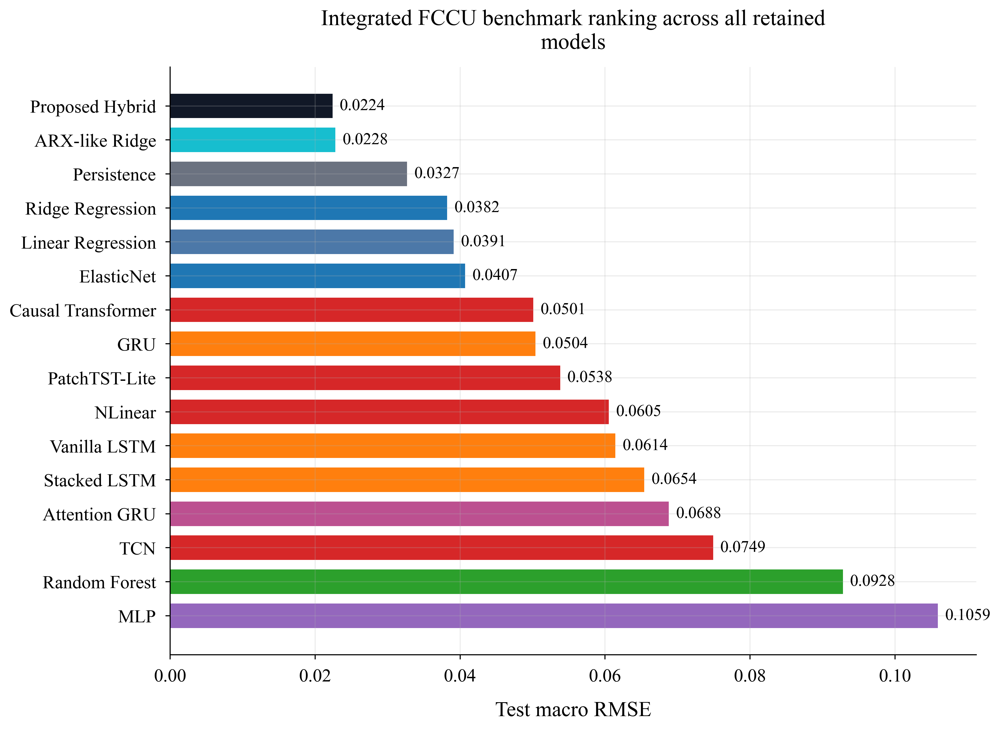

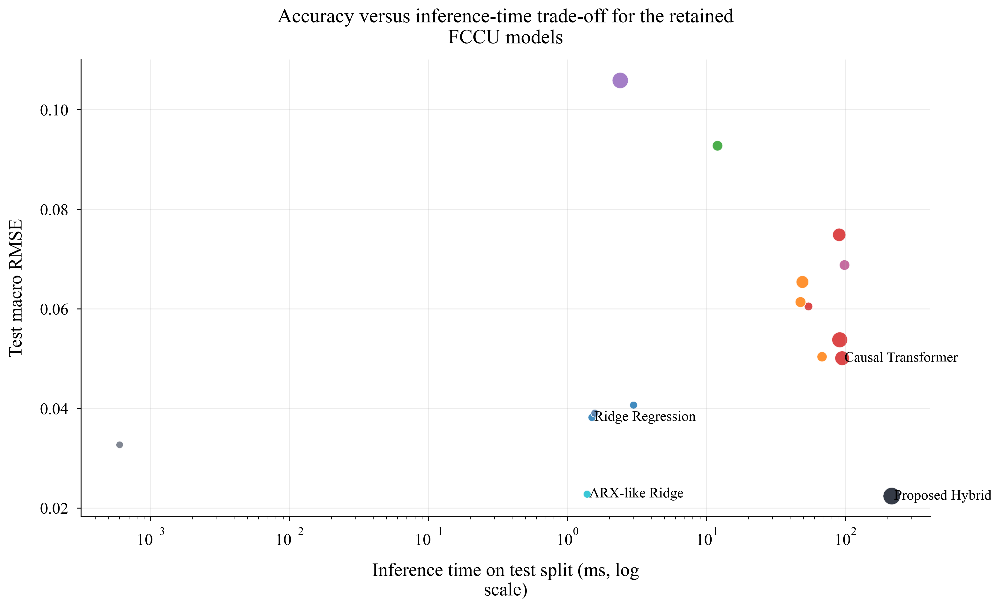

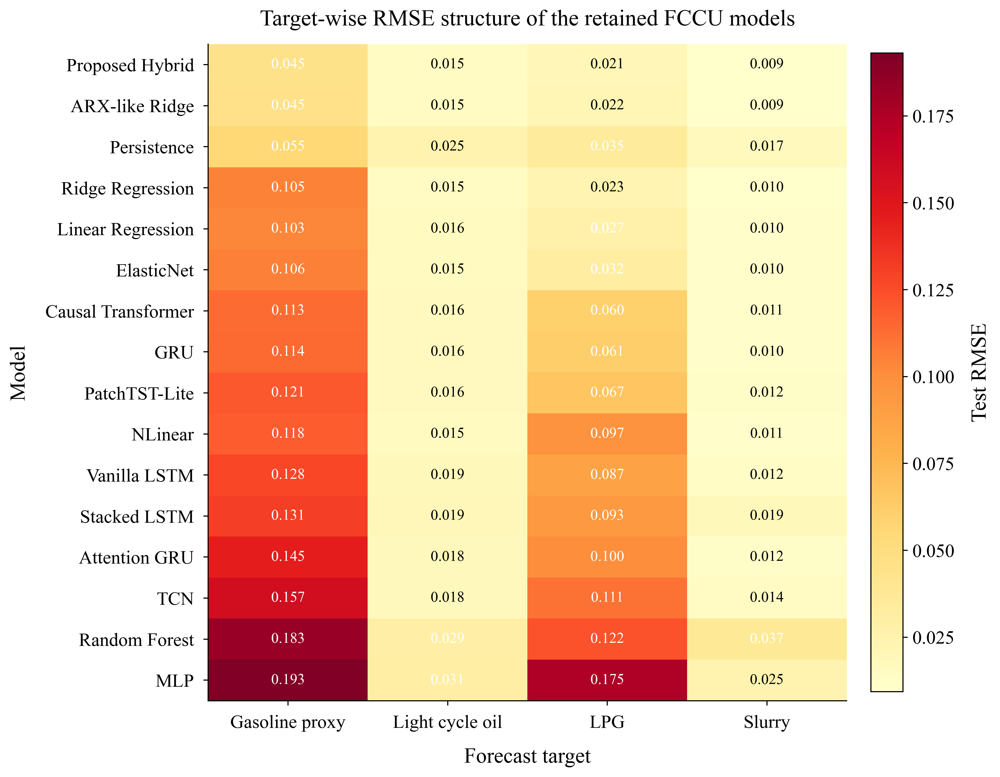

12967

In [4]:
ranking_df = comparison_unique_df.sort_values('test_rmse', ascending=False).copy()
ranking_colors = [FAMILY_COLORS.get(family, '#6b7280') for family in ranking_df['family']]
fig, ax = create_figure(figsize=(12.8, 8.0))
bars = ax.barh(ranking_df['model'], ranking_df['test_rmse'], color=ranking_colors, height=0.72)
add_bar_labels(ax, bars, fmt='{:.4f}')
style_axis(ax, 'Integrated FCCU benchmark ranking across all retained models', 'Test macro RMSE', None, grid_axis='x')
finalize_figure(fig, top=0.90, bottom=0.13, left=0.31, right=0.97)
plt.show()
plt.close(fig)
gc.collect()

fig, ax = create_figure(figsize=(11.8, 7.2))
size_values = comparison_unique_df['parameter_count'].fillna(comparison_unique_df['parameter_count'].median()).astype(float)
size_scale = 40 + 180 * (size_values / size_values.max())
for _, row in comparison_unique_df.iterrows():
    ax.scatter(
        row['inference_time_ms'],
        row['test_rmse'],
        s=float(size_scale.loc[row.name]),
        color=FAMILY_COLORS.get(row['family'], '#6b7280'),
        alpha=0.85,
        edgecolor='white',
        linewidth=0.7,
    )
for model_name in ['Ridge Regression', 'ARX-like Ridge', best_deep_model, 'Proposed Hybrid']:
    row = comparison_unique_df.query("model == @model_name").iloc[0]
    ax.text(
        row['inference_time_ms'] * 1.04,
        row['test_rmse'],
        model_name,
        ha='left',
        va='center',
        fontsize=12.2,
    )
ax.set_xscale('log')
style_axis(ax, 'Accuracy versus inference-time trade-off for the retained FCCU models', 'Inference time on test split (ms, log scale)', 'Test macro RMSE', grid_axis='both')
finalize_figure(fig, top=0.90, bottom=0.15, left=0.12, right=0.97)
plt.show()
plt.close(fig)
gc.collect()

heatmap_df = target_rmse_unique_df.set_index('model')[PRIMARY_TARGETS].loc[comparison_unique_df['model']]
value_matrix = heatmap_df.to_numpy(dtype=float)
fig, ax = create_figure(figsize=(11.4, 8.6))
im = ax.imshow(value_matrix, cmap='YlOrRd', aspect='auto')
ax.set_xticks(np.arange(len(PRIMARY_TARGETS)))
ax.set_xticklabels([TARGET_LABELS[col] for col in PRIMARY_TARGETS], rotation=0)
ax.set_yticks(np.arange(len(heatmap_df.index)))
ax.set_yticklabels(list(heatmap_df.index))
for i in range(value_matrix.shape[0]):
    for j in range(value_matrix.shape[1]):
        text_color = 'white' if value_matrix[i, j] > np.nanmedian(value_matrix) else 'black'
        ax.text(j, i, uformat(value_matrix[i, j], '{:.3f}'), ha='center', va='center', fontsize=11.2, color=text_color)
style_axis(ax, 'Target-wise RMSE structure of the retained FCCU models', 'Forecast target', 'Model', grid_axis=None)
cbar = fig.colorbar(im, ax=ax, fraction=0.046, pad=0.035)
cbar.set_label('Test RMSE', rotation=90, labelpad=12)
finalize_figure(fig, top=0.92, bottom=0.13, left=0.29, right=0.92)
plt.show()
plt.close(fig)
gc.collect()


## D. Operationally Focused Comparison

The integrated manuscript view should distinguish:
- the best conservative exogenous-only baseline,
- the best autoregressive classical reference,
- the best deep baseline,
- the proposed hybrid.

Subgroup metrics are available directly for the retained classical exogenous baseline, the ARX-like reference, and the proposed hybrid.


### Table D1. Target-wise RMSE for the shortlisted models

model,Gasoline proxy,Light cycle oil,LPG,Slurry,source_notebook
Ridge Regression,0.1053,0.0147,0.0233,0.0096,FCCU_02
ARX-like Ridge,0.0453,0.0146,0.0218,0.0094,FCCU_03
Causal Transformer,0.1134,0.0163,0.0600,0.0108,FCCU_03
Proposed Hybrid,0.0450,0.0146,0.0207,0.0093,FCCU_03


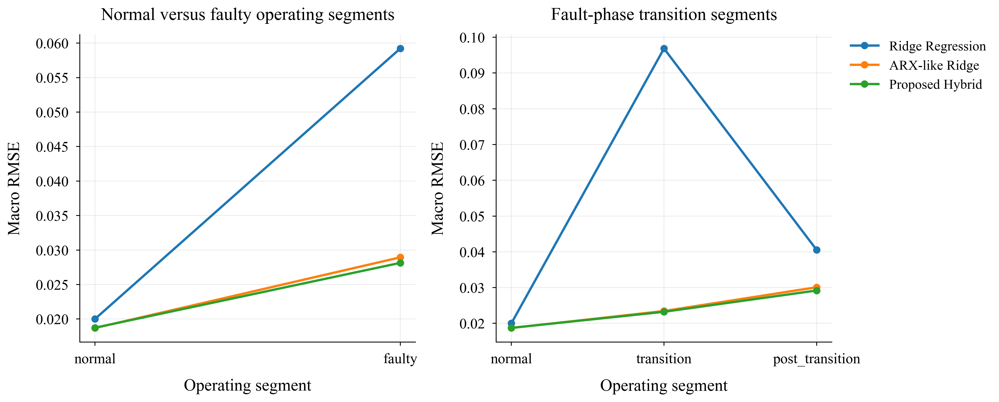

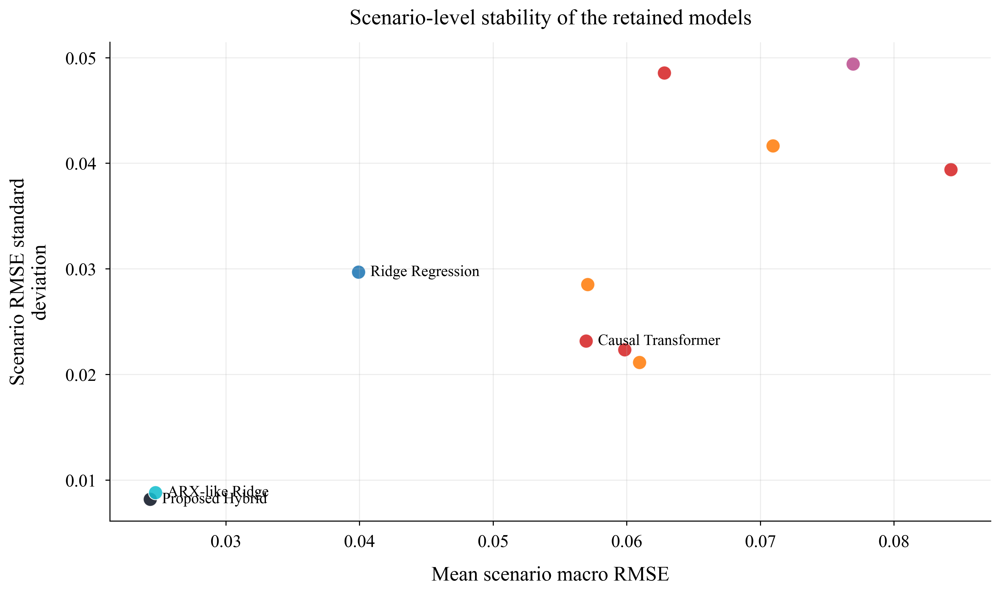

### Table D2. Scenario-level stability statistics

model,scenario_mean_rmse,scenario_std_rmse,scenario_median_rmse
Proposed Hybrid,0.0243,0.0082,0.0232
ARX-like Ridge,0.0247,0.0088,0.0234
Ridge Regression,0.0399,0.0297,0.0266
Causal Transformer,0.0569,0.0232,0.0570
GRU,0.0571,0.0285,0.0491
PatchTST-Lite,0.0598,0.0223,0.0529
Stacked LSTM,0.0609,0.0211,0.0579
NLinear,0.0628,0.0486,0.0363
Vanilla LSTM,0.0709,0.0417,0.0664
Attention GRU,0.0769,0.0494,0.0683


In [5]:
shortlist_target_df = target_rmse_unique_df.query('model in @shortlist_models').copy()
shortlist_target_df = shortlist_target_df.set_index('model').loc[shortlist_models].reset_index()
shortlist_target_df = shortlist_target_df.rename(columns={col: TARGET_LABELS[col] for col in PRIMARY_TARGETS})

display(Markdown('### Table D1. Target-wise RMSE for the shortlisted models'))
show_table(
    shortlist_target_df,
    formats={label: '{:.4f}' for label in TARGET_LABELS.values()},
)

subgroup_order = {
    'condition': ['normal', 'faulty'],
    'phase_group': ['normal', 'transition', 'post_transition'],
}
fig, axes = create_figure(nrows=1, ncols=2, figsize=(13.8, 5.8), squeeze=False)
for ax, group_name, title in [
    (axes[0, 0], 'condition', 'Normal versus faulty operating segments'),
    (axes[0, 1], 'phase_group', 'Fault-phase transition segments'),
]:
    sub = subgroup_metrics_df.query('group == @group_name').copy()
    sub['group_value'] = pd.Categorical(sub['group_value'], categories=subgroup_order[group_name], ordered=True)
    sub = sub.sort_values(['model', 'group_value'])
    for model_name in ['Ridge Regression', 'ARX-like Ridge', 'Proposed Hybrid']:
        model_sub = sub.query('model == @model_name')
        ax.plot(
            model_sub['group_value'].astype(str),
            model_sub['macro_rmse'],
            marker='o',
            linewidth=2.2,
            label=model_name,
        )
    style_axis(ax, title, 'Operating segment', 'Macro RMSE', grid_axis='both')
axes[0, 1].legend(frameon=False, loc='upper left', bbox_to_anchor=(1.02, 1.02))
finalize_figure(fig, top=0.90, bottom=0.20, left=0.08, right=0.80, wspace=0.24)
plt.show()
plt.close(fig)
gc.collect()

scenario_plot_df = scenario_stat_df.copy().sort_values('scenario_mean_rmse')
fig, ax = create_figure(figsize=(11.2, 7.0))
for _, row in scenario_plot_df.iterrows():
    color = FAMILY_COLORS.get(comparison_unique_df.set_index('model').loc[row['model'], 'family'], '#6b7280')
    ax.scatter(row['scenario_mean_rmse'], row['scenario_std_rmse'], s=120, color=color, alpha=0.88, edgecolor='white', linewidth=0.7)
for model_name in ['Ridge Regression', 'ARX-like Ridge', best_deep_model, 'Proposed Hybrid']:
    row = scenario_plot_df.query("model == @model_name").iloc[0]
    ax.text(row['scenario_mean_rmse'] + 0.0009, row['scenario_std_rmse'], model_name, ha='left', va='center', fontsize=12)
style_axis(ax, 'Scenario-level stability of the retained models', 'Mean scenario macro RMSE', 'Scenario RMSE standard deviation', grid_axis='both')
finalize_figure(fig, top=0.90, bottom=0.16, left=0.12, right=0.97)
plt.show()
plt.close(fig)
gc.collect()

display(Markdown('### Table D2. Scenario-level stability statistics'))
show_table(
    scenario_plot_df,
    formats={
        'scenario_mean_rmse': '{:.4f}',
        'scenario_std_rmse': '{:.4f}',
        'scenario_median_rmse': '{:.4f}',
    },
)


## E. Proposed-Model Diagnostics for Article Use

These tables and figures retain the reviewer-facing results that are directly relevant to the proposed hybrid model:
- ablation evidence,
- sensitivity to lookback, horizon, and seed,
- robustness to additive noise and random missingness,
- compact interpretability evidence from grouped permutation importance.


### Table E1. Ablation study

model,rmse,mae,r2,smape,parameter_count,best_epoch,training_time_sec
Hybrid Full (ablation),0.0224,0.0172,0.9679,0.1337,178332,2,45.7014
Hybrid without physical penalty,0.0224,0.0172,0.9679,0.1337,178332,2,43.5523
Hybrid without self-attention refinement,0.0224,0.0172,0.9678,0.1344,161564,0,28.9218
Hybrid without residual fusion,0.0224,0.0172,0.9676,0.1346,155100,2,44.1009
Hybrid without attention pooling,0.0225,0.0172,0.9675,0.1346,174107,2,44.0726
Hybrid without temporal convolution,0.0225,0.0173,0.9676,0.1346,128668,2,41.9385
Hybrid with short lookback,0.0522,0.0390,0.9430,0.2322,180796,3,39.8495
Hybrid with reduced exogenous feature set,0.0626,0.0488,0.9441,0.2475,175742,2,42.4929


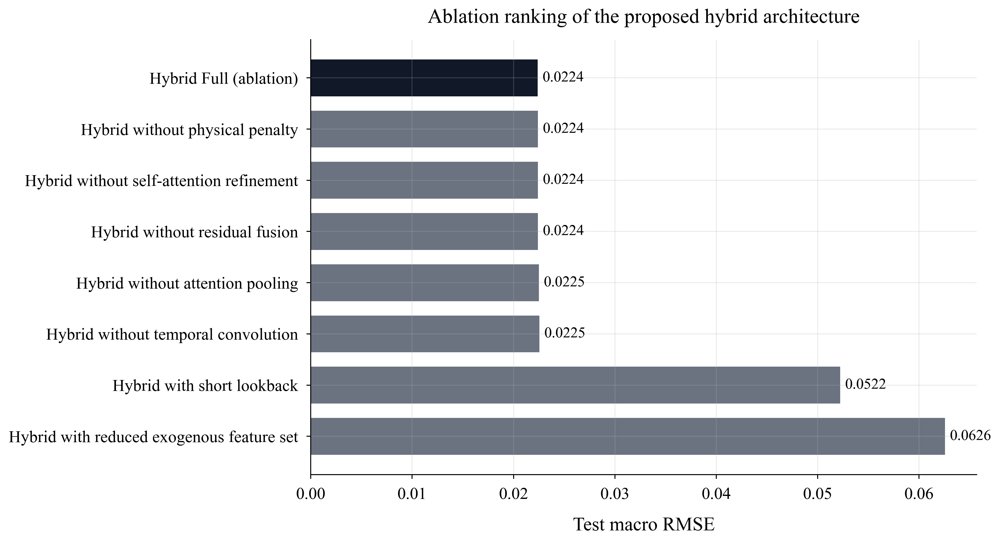

### Table E2. Sensitivity study

model,sensitivity_type,setting,rmse,mae,r2,training_time_sec
Horizon 1,horizon,1,0.0609,0.0455,0.9683,42.8200
Horizon 5,horizon,5,0.0224,0.0172,0.9679,42.3484
Horizon 15,horizon,15,0.1041,0.0822,0.7390,35.7026
Lookback 15,lookback,15,0.0519,0.0388,0.9439,37.4392
Lookback 30,lookback,30,0.0224,0.0172,0.9679,45.5173
Lookback 60,lookback,60,0.0979,0.0780,0.8444,94.8438
Seed 11,seed,11,0.0224,0.0172,0.9679,42.4372
Seed 42,seed,42,0.0224,0.0172,0.9679,42.2762
Seed 77,seed,77,0.0224,0.0172,0.9679,42.1895


### Table E3. Robustness study

robustness_type,setting,rmse,mae,r2
additive_noise,0.00,0.0224,0.0172,0.9679
additive_noise,0.01,0.0238,0.0185,0.9672
additive_noise,0.05,0.0408,0.0324,0.9523
random_missingness,0.00,0.0224,0.0172,0.9679
random_missingness,0.05,0.0950,0.0680,0.8273
random_missingness,0.10,0.1346,0.0964,0.6982


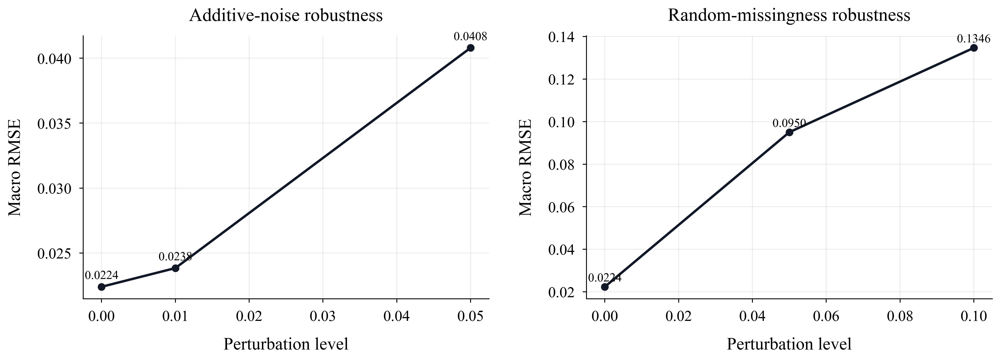

### Table E4. Top grouped permutation-importance features

feature_group,importance_mean_drop_in_r2,importance_std
valve_fractionator_pressure_V4_pct,10.1882,0.3108
fractionator_overhead_temperature_Tfra_degF,6.2004,0.0538
ambient_temperature_Tatm_degF,2.5796,0.1195
combustion_air_blower_current_ACAB_amp,2.3239,0.0378
stack_gas_o2_Co2_g_mol_pct,1.0251,0.0114
stack_gas_minus_regenerator_temperature_Tcyc_T...,0.8438,0.0130
furnace_firebox_temperature_T3_degF,0.5898,0.0079
wet_gas_compressor_current_AWGC_amp,0.5035,0.0140
valve_accumulator_level_V9_pct,0.3841,0.0132
fractionator_bottom_temperature_T20_degF,0.2137,0.0031


In [6]:
display(Markdown('### Table E1. Ablation study'))
show_table(
    ablation_df.sort_values('rmse'),
    formats={
        'rmse': '{:.4f}',
        'mae': '{:.4f}',
        'r2': '{:.4f}',
        'smape': '{:.4f}',
        'parameter_count': '{:.0f}',
        'best_epoch': '{:.0f}',
        'training_time_sec': '{:.4f}',
    },
)

plot_df = ablation_df.sort_values('rmse', ascending=False)
fig, ax = create_figure(figsize=(12.8, 6.6))
bars = ax.barh(plot_df['model'], plot_df['rmse'], color=['#111827' if 'Full' in name else '#6b7280' for name in plot_df['model']], height=0.72)
add_bar_labels(ax, bars, fmt='{:.4f}')
style_axis(ax, 'Ablation ranking of the proposed hybrid architecture', 'Test macro RMSE', None, grid_axis='x')
finalize_figure(fig, top=0.90, bottom=0.14, left=0.37, right=0.97)
plt.show()
plt.close(fig)
gc.collect()

display(Markdown('### Table E2. Sensitivity study'))
show_table(
    sensitivity_df[['model', 'sensitivity_type', 'setting', 'rmse', 'mae', 'r2', 'training_time_sec']].sort_values(['sensitivity_type', 'setting']),
    formats={
        'setting': '{:.0f}',
        'rmse': '{:.4f}',
        'mae': '{:.4f}',
        'r2': '{:.4f}',
        'training_time_sec': '{:.4f}',
    },
)

fig, axes = create_figure(nrows=1, ncols=3, figsize=(15.2, 4.8), squeeze=False)
for ax, sensitivity_type, title in [
    (axes[0, 0], 'lookback', 'Lookback sensitivity'),
    (axes[0, 1], 'horizon', 'Horizon sensitivity'),
    (axes[0, 2], 'seed', 'Seed sensitivity'),
]:
    sub = sensitivity_df.query('sensitivity_type == @sensitivity_type').sort_values('setting')
    ax.plot(sub['setting'], sub['rmse'], marker='o', linewidth=2.2, color='#111827')
    for x_value, y_value in zip(sub['setting'], sub['rmse']):
        ax.text(x_value, y_value + max(sub['rmse'].max() * 0.01, 1e-4), uformat(y_value, '{:.4f}'), ha='center', va='bottom', fontsize=11.2)
    style_axis(ax, title, 'Setting', 'Macro RMSE', grid_axis='both')
finalize_figure(fig, top=0.88, bottom=0.20, left=0.06, right=0.99, wspace=0.27)
plt.show()
plt.close(fig)
gc.collect()

display(Markdown('### Table E3. Robustness study'))
show_table(
    robustness_df.sort_values(['robustness_type', 'setting']),
    formats={
        'setting': '{:.2f}',
        'rmse': '{:.4f}',
        'mae': '{:.4f}',
        'r2': '{:.4f}',
    },
)

fig, axes = create_figure(nrows=1, ncols=2, figsize=(12.8, 4.9), squeeze=False)
for ax, robustness_type, title in [
    (axes[0, 0], 'additive_noise', 'Additive-noise robustness'),
    (axes[0, 1], 'random_missingness', 'Random-missingness robustness'),
]:
    sub = robustness_df.query('robustness_type == @robustness_type').sort_values('setting')
    ax.plot(sub['setting'], sub['rmse'], marker='o', linewidth=2.2, color='#111827')
    for x_value, y_value in zip(sub['setting'], sub['rmse']):
        ax.text(x_value, y_value + max(sub['rmse'].max() * 0.01, 1e-4), uformat(y_value, '{:.4f}'), ha='center', va='bottom', fontsize=11.2)
    style_axis(ax, title, 'Perturbation level', 'Macro RMSE', grid_axis='both')
finalize_figure(fig, top=0.88, bottom=0.20, left=0.08, right=0.98, wspace=0.24)
plt.show()
plt.close(fig)
gc.collect()

display(Markdown('### Table E4. Top grouped permutation-importance features'))
show_table(
    importance_df.head(10),
    formats={
        'importance_mean_drop_in_r2': '{:.4f}',
        'importance_std': '{:.4f}',
    },
)


## F. Manuscript-Ready Closing Notes

The final cell generates a compact evidence statement directly from the integrated tables so that the scientific claims remain aligned with the retained benchmark results.


In [7]:
overall_best = comparison_unique_df.iloc[0]
exogenous_best = comparison_unique_df.query("input_set == 'exogenous_only'").sort_values('test_rmse').iloc[0]
arx_best = comparison_unique_df.query("model == 'ARX-like Ridge'").iloc[0]
deep_best = comparison_unique_df.query("family in @deep_candidate_families").sort_values('test_rmse').iloc[0]
proposed_best = comparison_unique_df.query("model == 'Proposed Hybrid'").iloc[0]

summary_md = f'''
### Integrated scientific summary

- The integrated notebook retained **{len(comparison_unique_df)} unique models** after cross-notebook deduplication.
- The **best overall retained model** was **{overall_best['model']}** with test macro RMSE **{uformat(overall_best['test_rmse'], '{:.4f}')}** and macro R2 **{uformat(overall_best['test_r2'], '{:.4f}')}**.
- The **best exogenous-only baseline** was **{exogenous_best['model']}** with test macro RMSE **{uformat(exogenous_best['test_rmse'], '{:.4f}')}**.
- The **autoregressive classical reference** **ARX-like Ridge** reached test macro RMSE **{uformat(arx_best['test_rmse'], '{:.4f}')}**.
- The **best deep baseline** was **{deep_best['model']}** with test macro RMSE **{uformat(deep_best['test_rmse'], '{:.4f}')}**.
- The **proposed hybrid** achieved test macro RMSE **{uformat(proposed_best['test_rmse'], '{:.4f}')}**, corresponding to **{uformat(100.0 * (proposed_best['test_rmse'] - arx_best['test_rmse']) / arx_best['test_rmse'], '{:.2f}')}%** change relative to ARX-like Ridge and **{uformat(100.0 * (proposed_best['test_rmse'] - exogenous_best['test_rmse']) / exogenous_best['test_rmse'], '{:.2f}')}%** change relative to the best exogenous-only baseline.
- The proposed hybrid remained the retained top performer under the integrated comparison, and the ablation/sensitivity tables show that its advantage depends strongly on the full feature set and the 30-step lookback.
- For manuscript writing, the safest claim boundary is: the proposed hybrid achieved the strongest retained aggregate benchmark score in this executed workflow, while the ARX-like Ridge reference remained extremely competitive and should be discussed as a serious baseline rather than a weak comparator.
'''
display(Markdown(summary_md))



### Integrated scientific summary

- The integrated notebook retained **16 unique models** after cross-notebook deduplication.
- The **best overall retained model** was **Proposed Hybrid** with test macro RMSE **0.0224** and macro R2 **0.9679**.
- The **best exogenous-only baseline** was **Ridge Regression** with test macro RMSE **0.0382**.
- The **autoregressive classical reference** **ARX-like Ridge** reached test macro RMSE **0.0228**.
- The **best deep baseline** was **Causal Transformer** with test macro RMSE **0.0501**.
- The **proposed hybrid** achieved test macro RMSE **0.0224**, corresponding to **−1.75%** change relative to ARX-like Ridge and **−41.36%** change relative to the best exogenous-only baseline.
- The proposed hybrid remained the retained top performer under the integrated comparison, and the ablation/sensitivity tables show that its advantage depends strongly on the full feature set and the 30-step lookback.
- For manuscript writing, the safest claim boundary is: the proposed hybrid achieved the strongest retained aggregate benchmark score in this executed workflow, while the ARX-like Ridge reference remained extremely competitive and should be discussed as a serious baseline rather than a weak comparator.
